#### Reference:

1. https://www.kaggle.com/code/itsuki9180/a-segmentation-is-in-reverse-order
1. https://www.kaggle.com/code/samuelcortinhas/rnsa-3d-model-train-pytorch
1. https://www.kaggle.com/code/andradaolteanu/rsna-fracture-detection-dicom-images-explore#2.-Image-Data-%5B.dcm%5D
1. https://www.kaggle.com/code/weixinxu/submit-baseline
1. https://www.kaggle.com/code/mlwhiz/bilstm-pytorch-and-keras

#### Modeling Reference:
1. http://dx.doi.org/10.3174/ajnr.A7094
1. https://blog.devgenius.io/resnet50-6b42934db431
1. https://www.kaggle.com/code/samuelcortinhas/rnsa-3d-model-train-pytorch#Torch-dataloaders

## Downloads

In [1]:
INTERNET = True

if INTERNET == True:
    !python --version

    !pip install monai
    !pip install -q segmentation_models_pytorch

Python 3.7.12
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 31.8 MB/s eta 0:00:0000:01


## Import Libraries

In [2]:
import os
import sys
import numpy as np
import pandas as pd
from glob import glob
from PIL import Image
import cv2
import re
import gc
from tqdm import tqdm
import math

import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

import skimage.transform as skTrans
from skimage import exposure

import albumentations as alb
from albumentations.pytorch import ToTensorV2

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
from torch.cuda.amp import autocast, GradScaler
from torch.optim.lr_scheduler import OneCycleLR, CosineAnnealingWarmRestarts

import tensorflow as tf

from monai.transforms import Resize
import monai.transforms as transforms
from monai.networks.nets import resnet18, resnet101

import segmentation_models_pytorch as smp

from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold, StratifiedKFold

import warnings
warnings.filterwarnings("ignore")

## Config

In [3]:
SEED = 1927550
IMG_SIZE = 352
BATCH = 5
EPOCH = 50
CLASS = 7
hidden1 = 128
hidden2 = 64
KAGGLE = True
channel_3 = True
tot_slice = 30
best_loss = 1
device = 'cuda' if torch.cuda.is_available() else 'cpu'
encoder_backbone = 'resnet101'

trainlosslog = []
trainacclog = []
validlosslog = []
validacclog = []

In [4]:
if KAGGLE:
    work_path = '/kaggle/input'
else:
    work_path = '/content/drive/MyDrive/Colab_Notebooks'

base_path = f'{work_path}/stage-2-preprocessed-zip'
train_df = pd.read_csv(f'{work_path}/rsna-2022-cervical-spine-fracture-detection/train.csv')

#stage2_prep_list = os.listdir(f'{base_path}/stage2-prep')
stage2_prep_list = os.listdir(base_path)
stage2_prep_list = [os.path.splitext(os.path.basename(prep_path))[0] for prep_path in stage2_prep_list]
stage2_prep_uid = [prep_path.split('_')[0] for prep_path in stage2_prep_list]
voxel_df = pd.DataFrame(list(zip(stage2_prep_list, stage2_prep_uid)), columns=['id', 'StudyInstanceUID'])

kf = KFold(5)
for fold, (train_idx, valid_idx) in enumerate(kf.split(voxel_df, voxel_df)):
    voxel_df.loc[valid_idx, 'fold'] = fold

df_train = voxel_df[voxel_df['fold'] != fold].reset_index(drop=True)
df_valid = voxel_df[voxel_df['fold'] == fold].reset_index(drop=True)

In [5]:
seg_revert = [
    '1.2.826.0.1.3680043.1363',
    '1.2.826.0.1.3680043.20120',
    '1.2.826.0.1.3680043.2243',
    '1.2.826.0.1.3680043.24606',
    '1.2.826.0.1.3680043.32071'
]

## EDA

In [6]:
voxel_df

,id,StudyInstanceUID,fold
0,1.2.826.0.1.3680043.27079_C6,1.2.826.0.1.3680043.27079,0.0
1,1.2.826.0.1.3680043.7824_C6,1.2.826.0.1.3680043.7824,0.0
2,1.2.826.0.1.3680043.14728_C7,1.2.826.0.1.3680043.14728,0.0
3,1.2.826.0.1.3680043.24316_C5,1.2.826.0.1.3680043.24316,0.0
4,1.2.826.0.1.3680043.27426_C1,1.2.826.0.1.3680043.27426,0.0
...,...,...,...
2116,1.2.826.0.1.3680043.29993_C1,1.2.826.0.1.3680043.29993,4.0
2117,1.2.826.0.1.3680043.17094_C5,1.2.826.0.1.3680043.17094,4.0
2118,1.2.826.0.1.3680043.27583_C3,1.2.826.0.1.3680043.27583,4.0
2119,1.2.826.0.1.3680043.4438_C7,1.2.826.0.1.3680043.4438,4.0


In [7]:
# check the image size
# find the most sized image or the average
img_size = []
for idx in range(len(voxel_df)):
    loc = voxel_df.loc[idx]
    id_ = loc['id']
    path = f'{base_path}/{id_}.npz'
    
    img = np.load(path)['arr_0']
    img_size.append(img.shape[1]) # equivalent image size for both width and height

Mean value: 349.3022159358793


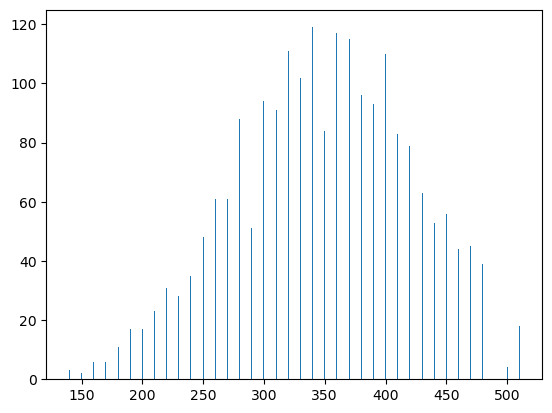

In [8]:
appr_img_size = [round(size/10)*10 for size in img_size]
unique, count = np.unique(appr_img_size, return_counts=True)

plt.bar(unique, count)

total = 0
total_count = 0
for idx in range(len(unique)):
    total += unique[idx] * count[idx]
    total_count += count[idx]

mean = total / total_count
print('Mean value:',mean)

## Useful Functions

In [9]:
# apply seed
def seed_everything(seed):
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)

In [10]:
data_transforms = {
    'train': alb.Compose([
                alb.Resize(IMG_SIZE, IMG_SIZE),
                alb.HorizontalFlip(p=0.5),
                alb.VerticalFlip(p=0.5),
                alb.Transpose(p=0.5),
                alb.RandomBrightness(limit=0.1, p=0.7),
                alb.ShiftScaleRotate(shift_limit=0.3, scale_limit=0.3, rotate_limit=45, border_mode=4, p=0.7),
                alb.OneOf([
                    alb.MotionBlur(blur_limit=3),
                    alb.MedianBlur(blur_limit=3),
                    alb.GaussianBlur(blur_limit=3),
                    alb.GaussNoise(var_limit=(3.0, 9.0))
                ], p=0.5),
                alb.OneOf([
                    alb.GridDistortion(num_steps=5, distort_limit=1.),
                    alb.OpticalDistortion(distort_limit=1.)
                ], p=0.5),
                alb.Sharpen(alpha=(0.3, 0.5), p=0.7)
             ]),
    'valid': alb.Compose([alb.Resize(IMG_SIZE, IMG_SIZE)])
}

## Drop Bad Scans

https://www.kaggle.com/competitions/rsna-2022-cervical-spine-fracture-detection/discussion/344862
https://www.kaggle.com/code/itsuki9180/a-segmentation-is-in-reverse-order


1. 1.2.826.0.1.3680043.20574: does not include a full cervical spine and should be ignored.
1. 1.2.826.0.1.3680043.29952: the slices are duplicated, meaning that there are 2 scans stiched to each other.
1. 1.2.826.0.1.3680043.1363: the scans are reversed, if cannot reverse it again, ignore.

In [11]:
bad_scans = ['1.2.826.0.1.3680043.20574','1.2.826.0.1.3680043.29952', '1.2.826.0.1.368004.23904']

for uid in bad_scans:
    train_df.drop(train_df[train_df['StudyInstanceUID']==uid].index, axis=0, inplace=True)

In [12]:
for uid in bad_scans:
    voxel_df.drop(voxel_df[voxel_df['StudyInstanceUID']==uid].index, axis=0, inplace=True)

## Dataset Class

In [13]:
# extract image and label of the given data
class CustomDataset(torch.utils.data.Dataset):
    # Initialize
    def __init__(self, voxel_df=df_train, train_df=train_df, transform=None, test=False):
        super().__init__()
        self.voxel_df = voxel_df
        self.train_df = train_df
        self.transform = transform
        self.test = test
    
    def __getitem__(self, index):
        voxel_UID = self.voxel_df.iloc[index]
        uid = voxel_UID['id'].split('_')[0]
        label_df = self.train_df 

        #print(voxel_UID['id'])
        
        #imgs = np.load(f'{base_path}/stage2-prep/{voxel_UID.id}.npz')['arr_0']
        imgs = np.load(f'{base_path}/{voxel_UID.id}.npz')['arr_0'] # 80 X img_size X img_size
        imgs = imgs.transpose(1, 2, 0) # img_size X img_size X 80
        
        if self.transform is not None:
            trans = self.transform(image=imgs)
            imgs = trans['image']
        
        imgs = imgs.transpose(2, 0, 1) # 80 X 512 X 512
        vertebrae = voxel_UID['id'].split('_')[1] # C1; C2; C3; C4; C5; C6; C7
        if self.test == True:
            return torch.tensor(np.array(imgs/255.0, dtype=np.float32)).float(), [uid, vertebrae]
        
        label = label_df[label_df['StudyInstanceUID'] == uid][vertebrae].values.astype('float32') # either 0 or 1
        return torch.tensor(np.array(imgs/255.0, dtype=np.float32)).float(), torch.tensor(label).float()
       
    # Length of dataset
    def __len__(self):
        return len(self.voxel_df)

### Test Dataset

In [14]:
def plot_batch(imgs, size=40):
    #plt.figure(figsize=(5*5, 5*(40//5)))
    fig, axs = plt.subplots(size//5, 5, figsize=(5*5, size))
    
    for idx in range(size):
        #plt.subplot(idx//5+1, idx%5+1, (idx//5+1, idx%5+1))
        img = imgs[idx,].numpy()*255.0
        img = img.astype('uint8')
        axs[idx//5, idx%5].imshow(img, cmap='bone')
        #plt.imshow(img, cmap='bone')
        
    plt.tight_layout()
    plt.show()

In [15]:
test_dataset = CustomDataset(voxel_df=voxel_df, train_df=train_df, transform=data_transforms['valid'], test=True)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=True)

[('1.2.826.0.1.3680043.15623',), ('C7',)]


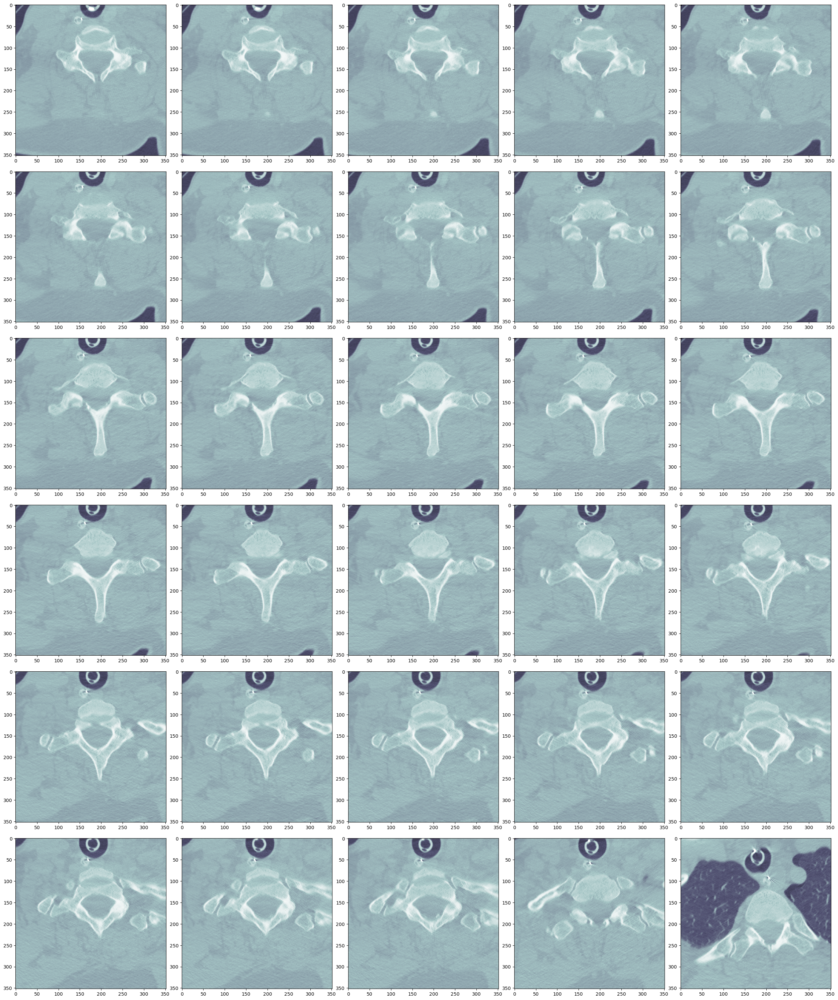

In [16]:
imgs, labels = next(iter(test_loader))
print(labels)
plot_batch(imgs[0], size=30)

[('1.2.826.0.1.3680043.20647',), ('C4',)]


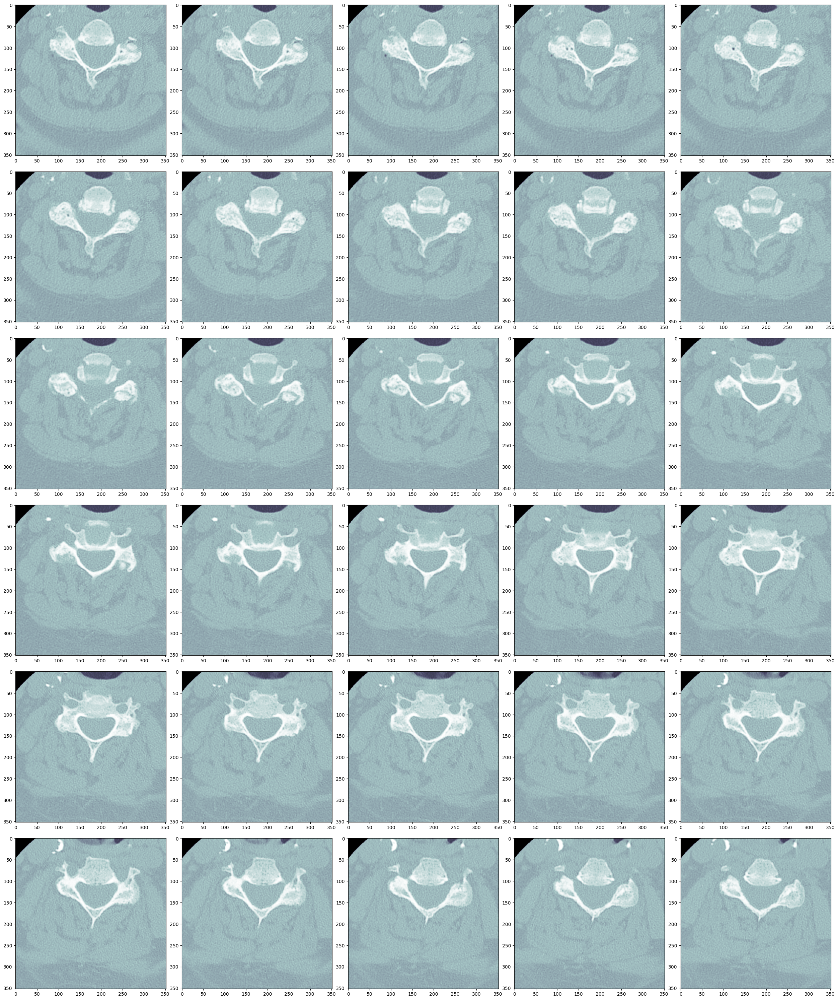

In [17]:
imgs, labels = next(iter(test_loader))
print(labels)
plot_batch(imgs[0], size=30)

## LSTM Model

In [18]:
# important to have a bigger backbone
# ResNet101 encoder backbone + UNet decoder => CrackNet
class ClassificationModel(nn.Module):
    def __init__(self):
        super(ClassificationModel, self).__init__()
        self.segmodel = smp.Unet(              # cnn
            encoder_backbone,                  # resnet101 backbone
            encoder_weights='imagenet',        # pretrained-weight = imagenet
            in_channels=tot_slice,             # in channels of 40*2
            classes=CLASS,                     # output channel be 7 from C1 to C7
            activation=None,
        )
        self.lstm = nn.LSTM( # output = (batch, sequence length, dimension * )
            input_size=(IMG_SIZE*IMG_SIZE), # 512 * 512 * 40(channel)
            hidden_size=hidden1, 
            num_layers=2, # num_layer = 2 if bidirectional = True. 1 otherwise
            dropout=0., 
            bidirectional=True, 
            batch_first=True # (batch_dimension, segment_dimension, feature_dimension)
        )
        self.head = nn.Sequential(
            nn.Linear(CLASS*(hidden1*2), IMG_SIZE), # dimensions, input image
            #nn.Linear(CLASS*512*512, 512),
            nn.BatchNorm1d(IMG_SIZE),
            nn.Dropout(0.3),
            nn.LeakyReLU(0.1),
            nn.Linear(IMG_SIZE, 1),
        )
    
    # input: (batch_size, tot_slice, image_size, image_size)
    def forward(self, x):
        batch_size = x.size(0)
        img_size = x.size(2) # or x.size(3); equal value
        
        x = self.segmodel(x)
        x = x.view(batch_size, CLASS, -1)
        # input: batch size, sequence length, input image size
        x,_ = self.lstm(x)
        x = x.contiguous().view(batch_size, -1)
        x = self.head(x)
        
        return x

## Settings

In [19]:
train_dataset = CustomDataset(voxel_df=df_train, train_df=train_df, transform=data_transforms['train'], test=False)
valid_dataset = CustomDataset(voxel_df=df_valid, train_df=train_df, transform=data_transforms['valid'], test=False)
train_loader = DataLoader(train_dataset, batch_size=BATCH, shuffle=True)
valid_loader = DataLoader(valid_dataset, batch_size=BATCH, shuffle=True)

In [20]:
# model setting
model = ClassificationModel()
model.to(device)
#model.load_state_dict(torch.load('/kaggle/input/stage2-cracknet-lstm-yolo-window/stage2_cracknet_best.ckpt'))

# Adam optimizer
optimizer = optim.AdamW(params=model.parameters(), lr=5e-5, weight_decay=1e-5)

Downloading: "https://download.pytorch.org/models/resnet101-5d3b4d8f.pth" to /root/.cache/torch/hub/checkpoints/resnet101-5d3b4d8f.pth


  0%|          | 0.00/170M [00:00<?, ?B/s]

## Competition Loss

In [21]:
# Replicate competition metric (https://www.kaggle.com/competitions/rsna-2022-cervical-spine-fracture-detection/discussion/341854)
loss_fn = F.binary_cross_entropy_with_logits

# The logits created from model training is either 0 or 1 for only one vertebrae
competition_weights = {
    '-' : torch.tensor(1, dtype=torch.float, device=device),
    '+' : torch.tensor(2, dtype=torch.float, device=device),
}

# with row-wise weights normalization (https://www.kaggle.com/competitions/rsna-2022-cervical-spine-fracture-detection/discussion/344565)
def competiton_loss_row_norm(y_hat, y):
    loss = loss_fn(y_hat.view(-1), y.to(y_hat.dtype).view(-1))
    weights = y * competition_weights['+'] + (1 - y) * competition_weights['-']
    loss = (loss * weights).sum(axis=1)
    w_sum = weights.sum(axis=1)
    loss = torch.div(loss, w_sum)
    return loss.mean()

## Training


In [22]:
def train(model, dataloader, optimizer):
    model.train()
    scaler = GradScaler()
    #scheduler = OneCycleLR(optimizer, max_lr=0.0005, epochs=1, steps_per_epoch=len(df_train), pct_start=0.3)
    
    train_loss = []
    train_acc = []
    
    for imgs, label in tqdm(dataloader):
        # set the gradient to 0 at initial
        optimizer.zero_grad()

        # forward data, making sure the data and model are on the same device
        with autocast(enabled=True):
            logits = model(imgs.to(device))
            loss = competiton_loss_row_norm(logits, label.to(device))
        
        #print('argmax:',logits.detach().cpu().numpy().argmax(axis=1))
        #print('max:',logits.detach().cpu().numpy().max(axis=1))
        #print('truth:',label.numpy())
        acc = (logits.argmax(dim=-1) == label.to(device)).float().mean()

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        #scheduler.step()
        
        train_loss.append(loss.item())
        train_acc.append(acc)
        
    train_loss = sum(train_loss) / len(train_loss)
    train_acc = sum(train_acc) / len(train_acc)
    
    return train_loss, train_acc

In [23]:
def validation(model, dataloader, optimizer):
    model.eval()
    valid_loss = []
    valid_acc = []

    for imgs, label in tqdm(dataloader):
        # no need gradient in validation
        # use torch.no_grad() accelerates the forward process
        with torch.no_grad():
            logits = model(imgs.to(device))
        
        loss = competiton_loss_row_norm(logits, label.to(device))
        acc = (logits.argmax(dim=-1) == label.to(device)).float().mean()
        
        valid_loss.append(loss.item())
        valid_acc.append(acc)
    
    valid_loss = sum(valid_loss) / len(valid_loss)
    valid_acc = sum(valid_acc) / len(valid_acc)
    
    return valid_loss, valid_acc

In [ ]:
seed_everything(SEED)

# initialize the best values to save
best_train_loss = 0
best_train_acc = 0
best_valid_loss = 0
best_valid_acc = 0

best_epoch = 0
early_stop_count = 0

scheduler = CosineAnnealingWarmRestarts(optimizer, EPOCH, eta_min=5e-6)

# start training
for epoch in range(EPOCH):
    print(f'### Epoch: {epoch+1} ###')
    train_loss, train_acc = train(model, train_loader, optimizer)
    print(f'[ Train | {epoch + 1:03d}/{EPOCH:03d} ] loss = {train_loss:.5f}, acc = {train_acc:.5f}')
    valid_loss, valid_acc = validation(model, valid_loader, optimizer)
    print(f'[ Valid | {epoch + 1:03d}/{EPOCH:03d} ] loss = {valid_loss:.5f}, acc = {valid_acc:.5f}')
    print()
    
    scheduler.step()
    
    # save train and valid logs
    trainlosslog.append(train_loss)
    trainacclog.append(train_acc.cpu().data.numpy())
    validlosslog.append(valid_loss)
    validacclog.append(valid_acc.cpu().data.numpy())
    
    # save models
    if valid_loss < best_loss:
        # save highest values
        best_train_loss, best_train_acc = train_loss, train_acc
        best_valid_loss, best_valid_acc = valid_loss, valid_acc
        best_epoch = epoch
        
        # save model
        torch.save(model.state_dict(), "stage2_cracknet_best.ckpt") # only save best to prevent output memory exceed error
        # reset values
        best_loss = valid_loss
        early_stop_count = 0
    
    """if early_stop_count > 10:
        print('Accuracy not increasing. Early Stopping...')
        break"""
    
    early_stop_count = early_stop_count + 1

print()
print(f"[ Best Train | {best_epoch+1:03d} / {EPOCH:03d} ] loss = {best_train_loss:.8f}, acc = {best_train_acc:.8f}")
print(f"[ Best Valid | {best_epoch+1:03d} / {EPOCH:03d} ] loss = {best_valid_loss:.8f}, acc = {best_valid_acc:.8f}")


### Epoch: 1 ###


100%|██████████| 340/340 [07:31<00:00,  1.33s/it]


[ Train | 001/050 ] loss = 0.50513, acc = 0.89118


100%|██████████| 85/85 [00:47<00:00,  1.81it/s]


[ Valid | 001/050 ] loss = 0.42397, acc = 0.89412

### Epoch: 2 ###


100%|██████████| 340/340 [08:03<00:00,  1.42s/it]


[ Train | 002/050 ] loss = 0.38206, acc = 0.89118


100%|██████████| 85/85 [00:53<00:00,  1.58it/s]


[ Valid | 002/050 ] loss = 0.38286, acc = 0.89353

### Epoch: 3 ###


100%|██████████| 340/340 [07:26<00:00,  1.31s/it]


[ Train | 003/050 ] loss = 0.36992, acc = 0.89029


100%|██████████| 85/85 [00:46<00:00,  1.82it/s]


[ Valid | 003/050 ] loss = 0.35929, acc = 0.89412

### Epoch: 4 ###


100%|██████████| 340/340 [07:27<00:00,  1.32s/it]


[ Train | 004/050 ] loss = 0.35994, acc = 0.89118


100%|██████████| 85/85 [00:46<00:00,  1.81it/s]


[ Valid | 004/050 ] loss = 0.37759, acc = 0.89412

### Epoch: 5 ###


100%|██████████| 340/340 [07:35<00:00,  1.34s/it]


[ Train | 005/050 ] loss = 0.35914, acc = 0.89118


100%|██████████| 85/85 [00:46<00:00,  1.83it/s]


[ Valid | 005/050 ] loss = 0.34852, acc = 0.89235

### Epoch: 6 ###


100%|██████████| 340/340 [07:28<00:00,  1.32s/it]


[ Train | 006/050 ] loss = 0.35707, acc = 0.89118


100%|██████████| 85/85 [00:46<00:00,  1.82it/s]


[ Valid | 006/050 ] loss = 0.36019, acc = 0.89412

### Epoch: 7 ###


100%|██████████| 340/340 [07:30<00:00,  1.32s/it]


[ Train | 007/050 ] loss = 0.36541, acc = 0.89029


100%|██████████| 85/85 [00:47<00:00,  1.81it/s]


[ Valid | 007/050 ] loss = 0.35786, acc = 0.89353

### Epoch: 8 ###


100%|██████████| 340/340 [07:35<00:00,  1.34s/it]


[ Train | 008/050 ] loss = 0.36054, acc = 0.89118


100%|██████████| 85/85 [00:46<00:00,  1.82it/s]


[ Valid | 008/050 ] loss = 0.36019, acc = 0.89353

### Epoch: 9 ###


100%|██████████| 340/340 [07:31<00:00,  1.33s/it]


[ Train | 009/050 ] loss = 0.35876, acc = 0.89118


100%|██████████| 85/85 [00:47<00:00,  1.78it/s]


[ Valid | 009/050 ] loss = 0.37987, acc = 0.89412

### Epoch: 10 ###


100%|██████████| 340/340 [07:27<00:00,  1.32s/it]


[ Train | 010/050 ] loss = 0.35813, acc = 0.89118


100%|██████████| 85/85 [00:46<00:00,  1.82it/s]


[ Valid | 010/050 ] loss = 0.34864, acc = 0.89294

### Epoch: 11 ###


100%|██████████| 340/340 [07:24<00:00,  1.31s/it]


[ Train | 011/050 ] loss = 0.36167, acc = 0.89118


100%|██████████| 85/85 [00:48<00:00,  1.77it/s]


[ Valid | 011/050 ] loss = 0.34590, acc = 0.89294

### Epoch: 12 ###


100%|██████████| 340/340 [07:29<00:00,  1.32s/it]


[ Train | 012/050 ] loss = 0.35993, acc = 0.89029


100%|██████████| 85/85 [00:47<00:00,  1.80it/s]


[ Valid | 012/050 ] loss = 0.35645, acc = 0.89412

### Epoch: 13 ###


100%|██████████| 340/340 [07:32<00:00,  1.33s/it]


[ Train | 013/050 ] loss = 0.35798, acc = 0.89118


100%|██████████| 85/85 [00:47<00:00,  1.81it/s]


[ Valid | 013/050 ] loss = 0.38238, acc = 0.89353

### Epoch: 14 ###


100%|██████████| 340/340 [07:27<00:00,  1.32s/it]


[ Train | 014/050 ] loss = 0.35260, acc = 0.89118


100%|██████████| 85/85 [00:46<00:00,  1.81it/s]


[ Valid | 014/050 ] loss = 0.33934, acc = 0.89353

### Epoch: 15 ###


100%|██████████| 340/340 [07:30<00:00,  1.33s/it]


[ Train | 015/050 ] loss = 0.35420, acc = 0.89029


100%|██████████| 85/85 [00:46<00:00,  1.81it/s]


[ Valid | 015/050 ] loss = 0.41207, acc = 0.89412

### Epoch: 16 ###


100%|██████████| 340/340 [07:22<00:00,  1.30s/it]


[ Train | 016/050 ] loss = 0.35891, acc = 0.89029


100%|██████████| 85/85 [00:46<00:00,  1.82it/s]


[ Valid | 016/050 ] loss = 0.34036, acc = 0.89412

### Epoch: 17 ###


100%|██████████| 340/340 [07:27<00:00,  1.32s/it]


[ Train | 017/050 ] loss = 0.36398, acc = 0.89029


100%|██████████| 85/85 [00:46<00:00,  1.83it/s]


[ Valid | 017/050 ] loss = 0.34710, acc = 0.89353

### Epoch: 18 ###


100%|██████████| 340/340 [07:30<00:00,  1.33s/it]


[ Train | 018/050 ] loss = 0.35610, acc = 0.89118


100%|██████████| 85/85 [00:46<00:00,  1.81it/s]


[ Valid | 018/050 ] loss = 0.36345, acc = 0.89353

### Epoch: 19 ###


100%|██████████| 340/340 [07:27<00:00,  1.32s/it]


[ Train | 019/050 ] loss = 0.35946, acc = 0.89118


100%|██████████| 85/85 [00:47<00:00,  1.79it/s]


[ Valid | 019/050 ] loss = 0.35017, acc = 0.89412

### Epoch: 20 ###


100%|██████████| 340/340 [07:30<00:00,  1.32s/it]


[ Train | 020/050 ] loss = 0.35451, acc = 0.89118


100%|██████████| 85/85 [00:46<00:00,  1.81it/s]


[ Valid | 020/050 ] loss = 0.33993, acc = 0.89412

### Epoch: 21 ###


100%|██████████| 340/340 [07:31<00:00,  1.33s/it]


[ Train | 021/050 ] loss = 0.35849, acc = 0.88941


100%|██████████| 85/85 [00:46<00:00,  1.81it/s]


[ Valid | 021/050 ] loss = 0.39660, acc = 0.89412

### Epoch: 22 ###


100%|██████████| 340/340 [07:28<00:00,  1.32s/it]


[ Train | 022/050 ] loss = 0.36001, acc = 0.89118


100%|██████████| 85/85 [00:46<00:00,  1.81it/s]


[ Valid | 022/050 ] loss = 0.35285, acc = 0.89412

### Epoch: 23 ###


100%|██████████| 340/340 [07:29<00:00,  1.32s/it]


[ Train | 023/050 ] loss = 0.35859, acc = 0.89118


100%|██████████| 85/85 [00:47<00:00,  1.80it/s]


[ Valid | 023/050 ] loss = 0.37016, acc = 0.89412

### Epoch: 24 ###


100%|██████████| 340/340 [07:29<00:00,  1.32s/it]


[ Train | 024/050 ] loss = 0.35788, acc = 0.89118


100%|██████████| 85/85 [00:47<00:00,  1.80it/s]


[ Valid | 024/050 ] loss = 0.36876, acc = 0.89294

### Epoch: 25 ###


100%|██████████| 340/340 [07:28<00:00,  1.32s/it]


[ Train | 025/050 ] loss = 0.35559, acc = 0.89118


100%|██████████| 85/85 [00:46<00:00,  1.81it/s]


[ Valid | 025/050 ] loss = 0.34542, acc = 0.89353

### Epoch: 26 ###


100%|██████████| 340/340 [07:26<00:00,  1.31s/it]


[ Train | 026/050 ] loss = 0.35224, acc = 0.89118


100%|██████████| 85/85 [00:47<00:00,  1.81it/s]


[ Valid | 026/050 ] loss = 0.34291, acc = 0.89412

### Epoch: 27 ###


100%|██████████| 340/340 [07:31<00:00,  1.33s/it]


[ Train | 027/050 ] loss = 0.35473, acc = 0.89118


100%|██████████| 85/85 [00:46<00:00,  1.81it/s]


[ Valid | 027/050 ] loss = 0.36758, acc = 0.89412

### Epoch: 28 ###


100%|██████████| 340/340 [07:26<00:00,  1.31s/it]


[ Train | 028/050 ] loss = 0.35775, acc = 0.89029


100%|██████████| 85/85 [00:47<00:00,  1.79it/s]


[ Valid | 028/050 ] loss = 0.35008, acc = 0.89412

### Epoch: 29 ###


100%|██████████| 340/340 [07:27<00:00,  1.32s/it]


[ Train | 029/050 ] loss = 0.35887, acc = 0.89118


100%|██████████| 85/85 [00:46<00:00,  1.81it/s]


[ Valid | 029/050 ] loss = 0.36063, acc = 0.89353

### Epoch: 30 ###


100%|██████████| 340/340 [07:28<00:00,  1.32s/it]


[ Train | 030/050 ] loss = 0.35392, acc = 0.89118


100%|██████████| 85/85 [00:47<00:00,  1.80it/s]


[ Valid | 030/050 ] loss = 0.34524, acc = 0.89353

### Epoch: 31 ###


100%|██████████| 340/340 [07:27<00:00,  1.32s/it]


[ Train | 031/050 ] loss = 0.34763, acc = 0.89118


100%|██████████| 85/85 [00:47<00:00,  1.80it/s]


[ Valid | 031/050 ] loss = 0.35781, acc = 0.89412

### Epoch: 32 ###


100%|██████████| 340/340 [07:30<00:00,  1.32s/it]


[ Train | 032/050 ] loss = 0.34699, acc = 0.89118


100%|██████████| 85/85 [00:47<00:00,  1.80it/s]


[ Valid | 032/050 ] loss = 0.35316, acc = 0.89353

### Epoch: 33 ###


100%|██████████| 340/340 [07:30<00:00,  1.33s/it]


[ Train | 033/050 ] loss = 0.34835, acc = 0.89118


100%|██████████| 85/85 [00:46<00:00,  1.83it/s]


[ Valid | 033/050 ] loss = 0.36023, acc = 0.89412

### Epoch: 34 ###


100%|██████████| 340/340 [07:31<00:00,  1.33s/it]


[ Train | 034/050 ] loss = 0.34798, acc = 0.89118


100%|██████████| 85/85 [00:47<00:00,  1.81it/s]


[ Valid | 034/050 ] loss = 0.34597, acc = 0.89412

### Epoch: 35 ###


100%|██████████| 340/340 [07:31<00:00,  1.33s/it]


[ Train | 035/050 ] loss = 0.34726, acc = 0.89118


100%|██████████| 85/85 [00:47<00:00,  1.80it/s]


[ Valid | 035/050 ] loss = 0.34441, acc = 0.89353

### Epoch: 36 ###


100%|██████████| 340/340 [07:29<00:00,  1.32s/it]


[ Train | 036/050 ] loss = 0.35087, acc = 0.89118


100%|██████████| 85/85 [00:47<00:00,  1.81it/s]


[ Valid | 036/050 ] loss = 0.35172, acc = 0.89412

### Epoch: 37 ###


100%|██████████| 340/340 [07:30<00:00,  1.32s/it]


[ Train | 037/050 ] loss = 0.34744, acc = 0.89118


100%|██████████| 85/85 [00:47<00:00,  1.81it/s]


[ Valid | 037/050 ] loss = 0.34240, acc = 0.89412

### Epoch: 38 ###


100%|██████████| 340/340 [07:28<00:00,  1.32s/it]


[ Train | 038/050 ] loss = 0.35555, acc = 0.89029


100%|██████████| 85/85 [00:46<00:00,  1.81it/s]


[ Valid | 038/050 ] loss = 0.35590, acc = 0.89353

### Epoch: 39 ###


100%|██████████| 340/340 [07:32<00:00,  1.33s/it]


[ Train | 039/050 ] loss = 0.34876, acc = 0.89118


100%|██████████| 85/85 [00:47<00:00,  1.81it/s]


[ Valid | 039/050 ] loss = 0.34072, acc = 0.89412

### Epoch: 40 ###


100%|██████████| 340/340 [07:29<00:00,  1.32s/it]


[ Train | 040/050 ] loss = 0.35217, acc = 0.89118


100%|██████████| 85/85 [00:47<00:00,  1.80it/s]


[ Valid | 040/050 ] loss = 0.34773, acc = 0.89353

### Epoch: 41 ###


100%|██████████| 340/340 [07:26<00:00,  1.31s/it]


[ Train | 041/050 ] loss = 0.34951, acc = 0.89029


100%|██████████| 85/85 [00:46<00:00,  1.82it/s]


[ Valid | 041/050 ] loss = 0.35810, acc = 0.89412

### Epoch: 42 ###


100%|██████████| 340/340 [07:32<00:00,  1.33s/it]


[ Train | 042/050 ] loss = 0.34812, acc = 0.89118


100%|██████████| 85/85 [00:46<00:00,  1.82it/s]


[ Valid | 042/050 ] loss = 0.35218, acc = 0.89353

### Epoch: 43 ###


100%|██████████| 340/340 [07:28<00:00,  1.32s/it]


[ Train | 043/050 ] loss = 0.35026, acc = 0.89118


100%|██████████| 85/85 [00:46<00:00,  1.82it/s]


[ Valid | 043/050 ] loss = 0.36125, acc = 0.89412

### Epoch: 44 ###


100%|██████████| 340/340 [07:26<00:00,  1.31s/it]


[ Train | 044/050 ] loss = 0.34735, acc = 0.89118


100%|██████████| 85/85 [00:46<00:00,  1.81it/s]


[ Valid | 044/050 ] loss = 0.35883, acc = 0.89294

### Epoch: 45 ###


100%|██████████| 340/340 [07:23<00:00,  1.31s/it]


[ Train | 045/050 ] loss = 0.35150, acc = 0.89118


100%|██████████| 85/85 [00:46<00:00,  1.83it/s]


[ Valid | 045/050 ] loss = 0.35284, acc = 0.89412

### Epoch: 46 ###


100%|██████████| 340/340 [07:25<00:00,  1.31s/it]


[ Train | 046/050 ] loss = 0.34909, acc = 0.89118


100%|██████████| 85/85 [00:46<00:00,  1.82it/s]


[ Valid | 046/050 ] loss = 0.34636, acc = 0.89412

### Epoch: 47 ###


100%|██████████| 340/340 [07:24<00:00,  1.31s/it]


[ Train | 047/050 ] loss = 0.34779, acc = 0.89118


100%|██████████| 85/85 [00:46<00:00,  1.82it/s]


[ Valid | 047/050 ] loss = 0.35008, acc = 0.89353

### Epoch: 48 ###


100%|██████████| 340/340 [07:29<00:00,  1.32s/it]


[ Train | 048/050 ] loss = 0.35218, acc = 0.89118


100%|██████████| 85/85 [00:46<00:00,  1.81it/s]


[ Valid | 048/050 ] loss = 0.35436, acc = 0.89412

### Epoch: 49 ###


100%|██████████| 340/340 [07:25<00:00,  1.31s/it]


[ Train | 049/050 ] loss = 0.34725, acc = 0.89118


100%|██████████| 85/85 [00:46<00:00,  1.81it/s]


[ Valid | 049/050 ] loss = 0.35499, acc = 0.89412

### Epoch: 50 ###


 72%|███████▏  | 245/340 [05:23<02:03,  1.30s/it]

In [ ]:
log_df = pd.DataFrame(
    {
        'trainLoss': trainlosslog,
        'trainAcc': trainacclog,
        'validLoss': validlosslog,
        'validAcc': validacclog
    })

log_df.to_csv('Logs.csv')